In [1]:
from csbdeep.utils import normalize
from stardist.models import StarDist2D
import matplotlib.pyplot as plt
import squidpy as sq
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import anndata
import geopandas as gpd
import scanpy as sc
from tifffile import imread, imwrite
from shapely.geometry import Polygon, Point
from scipy import sparse
from matplotlib.colors import ListedColormap
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
import os, math, json, numpy as np, cv2, matplotlib.pyplot as plt
from skimage import color, filters, morphology, measure, segmentation, exposure, util
from skimage.filters import threshold_otsu, threshold_yen, threshold_triangle
from scipy import ndimage as ndi
import gc
from skimage import morphology, measure

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

2025-09-22 09:50:25.232548: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-09-22 09:50:26.936705: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758527427.209457  258059 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758527427.276525  258059 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-09-22 09:50:28.201417: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

Tiny nuclei filtering: {'n_before': 1025006, 'n_after': 101306, 'removed': 923700, 'min_area_um2': 27.49, 'min_area_px': 110, 'nucleus_diam_um': 10.0, 'um_per_px': 0.5}


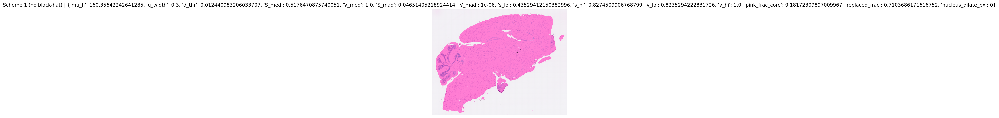

In [42]:
np.random.seed(0)

def ensure_uint8(img):
    if img.dtype == np.uint8:
        return img
    return util.img_as_ubyte(img)

def as_rgb(img):
    if img.ndim == 2:
        img = np.stack([img]*3, axis=-1)
    if img.shape[-1] == 4:
        img = img[..., :3]
    return ensure_uint8(img)

def show(img, title='', cmap=None, figsize=(6,6)):
    plt.figure(figsize=figsize)
    if img.ndim == 2:
        plt.imshow(img, cmap=cmap or 'gray')
    else:
        plt.imshow(img)
    plt.title(title); plt.axis('off'); plt.show()



image_path = "..Visium_HD_Mouse_Brain_tissue_image.tif" 

um_per_px = 0.5
nucleus_diam_um = 10.0


try:
    from tifffile import imread as tiff_imread
    rgb = tiff_imread(image_path)
    if rgb.ndim == 3 and rgb.shape[-1] >= 3:
        rgb = rgb[..., :3]
except Exception:
    bgr = cv2.imread(image_path)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image: {image_path}")
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

rgb = as_rgb(rgb)


def adaptive_kernel_px(um_per_px: float, nucleus_diam_um: float = 10.0) -> int:
    d_px = max(3, int(round(nucleus_diam_um / max(um_per_px, 1e-6))))
    if d_px % 2 == 0:
        d_px += 1
    return d_px

def get_tissue_mask(rgb, method="S", um_per_px=0.5, min_obj_um2=400.0):
    rgb = as_rgb(rgb)
    if method.lower().startswith("h"):  # hematoxylin
        hed = color.rgb2hed(rgb)
        chan = hed[..., 0]
        
        chan = exposure.rescale_intensity(-chan,
                                          in_range=(np.percentile(-chan, 2), np.percentile(-chan, 98)))
    else:  # "S" (HSV saturation)
        hsv = cv2.cvtColor(rgb, cv2.COLOR_RGB2HSV)
        chan = hsv[..., 1] / 255.0

    thr = threshold_otsu(chan)
    mask = chan > thr

    
    area_px_min = int(round((min_obj_um2 / (um_per_px ** 2))))
    mask = morphology.remove_small_objects(mask, area_px_min)
    mask = morphology.remove_small_holes(mask, area_px_min)

    k = adaptive_kernel_px(um_per_px, nucleus_diam_um=8.0)
    se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (k, k))
    mask = cv2.morphologyEx(mask.astype(np.uint8) * 255, cv2.MORPH_CLOSE, se) > 0
    return mask

tissue_method = "S"  #  "hematoxylin"
tissue_mask = get_tissue_mask(rgb, method=tissue_method, um_per_px=um_per_px)

overlay = rgb.copy()
overlay[~tissue_mask] = (overlay[~tissue_mask] * 0.25).astype(np.uint8)

# robust hue-based artifact mask (automatic)
def robust_hue_artifact_mask(rgb, tissue_mask, pclip=(5,95), target_area_range=(0.005, 0.30)):
    rgb = as_rgb(rgb)
    hsv = cv2.cvtColor(rgb, cv2.COLOR_RGB2HSV)
    H = hsv[..., 0].astype(np.float32)  # [0,179] OpenCV

    tissue_idx = tissue_mask > 0
    h_vals = H[tissue_idx]
    if h_vals.size == 0:
        return np.zeros(H.shape, bool), {"method": None, "area_frac": 0.0}

    lo, hi = np.percentile(h_vals, pclip)
    h_clip = np.clip(H, lo, hi)
    h_norm = (h_clip - lo) / max(hi - lo, 1e-6)  # [0,1]

    thr_candidates = []
    for mname, mfun in (("yen", threshold_yen), ("triangle", threshold_triangle), ("otsu", threshold_otsu)):
        try:
            thr = float(mfun(h_norm[tissue_idx]))
            thr_candidates.append((mname, thr))
        except Exception:
            pass

    def eval_mask(thr, pick_low):
        if pick_low:
            m = (h_norm <= thr) & tissue_idx
        else:
            m = (h_norm >= thr) & tissue_idx
        af = float(m.sum()) / float(tissue_idx.sum())
        return m, af

    best = None
    for mname, thr in thr_candidates:
        for tail in ("high", "low"):
            m, af = eval_mask(thr, pick_low=(tail=="low"))
            if target_area_range[0] <= af <= target_area_range[1]:
                labeled = measure.label(m)
                ncomp = labeled.max()
                score = af + 0.001*ncomp 
                if (best is None) or (score < best[0]):
                    best = (score, mname, thr, tail, af, ncomp, m)

    if best is None:
       
        q = 0.95
        thr_high = np.quantile(h_norm[tissue_idx], q)
        thr_low  = np.quantile(h_norm[tissue_idx], 1-q)
        m_high, af_high = eval_mask(thr_high, pick_low=False)
        m_low,  af_low  = eval_mask(thr_low,  pick_low=True)
        if af_high <= af_low:
            return m_high, {"method":"quantile","thr":thr_high,"tail":"high","area_frac":af_high,"pclip":pclip}
        else:
            return m_low, {"method":"quantile","thr":thr_low,"tail":"low","area_frac":af_low,"pclip":pclip}

    _, mname, thr, tail, af, ncomp, mask = best
    info = {"method":mname, "thr":thr, "tail":tail, "area_frac":af,
            "n_components":int(ncomp), "pclip":pclip, "target_area_range":target_area_range}
    return mask, info

artifact_mask, art_info = robust_hue_artifact_mask(rgb, tissue_mask, pclip=(5,95), target_area_range=(0.005,0.30))

k_px = adaptive_kernel_px(um_per_px, nucleus_diam_um=nucleus_diam_um)


try:
    nucleus_diam_um
except NameError:
    nucleus_diam_um = 10.0

def filter_small_nuclei(nuc_mask_bool, um_per_px, nucleus_diam_um=10.0,
                        min_area_um2=None, min_area_factor=0.25, fill_holes=True):
    """
    Connected regions with an area < (π*(d/2)^2)*min_area_factor are treated as "small nuclei/fragments" and removed.
    - If min_area_um2 is provided, filtering is performed directly based on this threshold (in µm²).
    """
    nuc_mask_bool = nuc_mask_bool.astype(bool)
    expected_um2 = np.pi * (nucleus_diam_um/2.0)**2
    thr_um2 = float(min_area_um2) if (min_area_um2 is not None) else expected_um2 * float(min_area_factor)
    thr_px  = int(round(thr_um2 / (um_per_px**2)))

    n_before = measure.label(nuc_mask_bool).max()
    out = morphology.remove_small_objects(nuc_mask_bool, min_size=max(1, thr_px))
    if fill_holes:
        out = morphology.remove_small_holes(out, area_threshold=max(1, thr_px))
    n_after = measure.label(out).max()

    info = {
        "n_before": int(n_before), "n_after": int(n_after),
        "removed": int(n_before - n_after),
        "min_area_um2": round(thr_um2, 2), "min_area_px": int(thr_px),
        "nucleus_diam_um": float(nucleus_diam_um), "um_per_px": float(um_per_px),
    }
    return out, info

artifact_mask_filt, filt_info = filter_small_nuclei(
    artifact_mask, um_per_px, nucleus_diam_um=nucleus_diam_um,
    min_area_um2=None,        
    min_area_factor=0.35,   
    fill_holes=True
)
print("Tiny nuclei filtering:", filt_info)


import numpy as np, cv2
from scipy.stats import median_abs_deviation as mad

def keep_nuclei_and_pink_no_bh(
    rgb, tissue_mask, nuclei_mask,    
    q_width=0.30, k_s=2.0, k_v=2.0,    
    nucleus_dilate_px=0,
    smooth_replaced=True, k_px_for_smooth=9
):
    hsv = cv2.cvtColor(rgb, cv2.COLOR_RGB2HSV)
    H = hsv[...,0].astype(np.float32)                # 0–179
    S = hsv[...,1].astype(np.float32) / 255.0
    V = hsv[...,2].astype(np.float32) / 255.0

   
    if nucleus_dilate_px > 0:
        k = nucleus_dilate_px if nucleus_dilate_px % 2 == 1 else nucleus_dilate_px+1
        se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (k, k))
        nuclei_safe = cv2.dilate(nuclei_mask.astype(np.uint8), se).astype(bool)
    else:
        nuclei_safe = nuclei_mask.astype(bool)

    domain = (tissue_mask.astype(bool) & (~nuclei_safe))
    if domain.sum() == 0:
        return rgb.copy(), {'note':'empty domain'}, {'replace_mask': np.zeros(H.shape, bool)}

  
    theta = H[domain] / 180.0 * 2*np.pi
    w = np.clip(S[domain], 0.05, None)
    mu_x = np.sum(w*np.cos(theta)) / (w.sum()+1e-9)
    mu_y = np.sum(w*np.sin(theta)) / (w.sum()+1e-9)
    mu = np.arctan2(mu_y, mu_x)

    theta_all = H / 180.0 * 2*np.pi
    d = np.abs(np.angle(np.exp(1j*(theta_all - mu))))
    d_thr = np.quantile(d[domain], q_width)

    S_dom, V_dom = S[domain], V[domain]
    S_med, V_med = np.median(S_dom), np.median(V_dom)
    S_mad = mad(S_dom, scale='normal') + 1e-6
    V_mad = mad(V_dom, scale='normal') + 1e-6
    s_lo, s_hi = np.percentile(S_dom, (5, 99.5))
    v_lo, v_hi = np.percentile(V_dom, (2, 99.8))

    pink_mask_core = (d <= d_thr) \
                     & (np.abs(S - S_med) <= k_s * S_mad) \
                     & (np.abs(V - V_med) <= k_v * V_mad) \
                     & (S >= s_lo) & (S <= s_hi) & (V >= v_lo) & (V <= v_hi) \
                     & tissue_mask & (~nuclei_safe)

    replace_mask = domain & (~pink_mask_core)

    sel = pink_mask_core if pink_mask_core.sum() >= 500 else domain
    med_h = np.median(H[sel]).astype(np.uint8)
    med_s = (np.median(S[sel]*255)).astype(np.uint8)
    med_v = (np.median(V[sel]*255)).astype(np.uint8)
    pink_ref = np.array([med_h, med_s, med_v], dtype=np.uint8)

    out_hsv = hsv.copy()
    out_hsv[replace_mask] = pink_ref
    out = cv2.cvtColor(out_hsv, cv2.COLOR_HSV2RGB)

    if smooth_replaced and replace_mask.any():
        sm = cv2.bilateralFilter(out, d=max(5,k_px_for_smooth), sigmaColor=40, sigmaSpace=max(5,k_px_for_smooth))
        out = np.where(replace_mask[...,None], sm, out)

    info = {
        'mu_h': float(((mu % (2*np.pi)) / (2*np.pi) * 180.0)),
        'q_width': float(q_width), 'd_thr': float(d_thr),
        'S_med': float(S_med), 'V_med': float(V_med),
        'S_mad': float(S_mad), 'V_mad': float(V_mad),
        's_lo': float(s_lo), 's_hi': float(s_hi), 'v_lo': float(v_lo), 'v_hi': float(v_hi),
        'pink_frac_core': float(pink_mask_core.sum())/float(tissue_mask.sum()+1e-9),
        'replaced_frac': float(replace_mask.sum())/float(tissue_mask.sum()+1e-9),
        'nucleus_dilate_px': int(nucleus_dilate_px)
    }
    return out, info, {'replace_mask': replace_mask, 'nonpink_mask': (domain & (~pink_mask_core)), 'nuclei_mask_used': nuclei_safe}


img_keep_pink, info_pink, masks_pink = keep_nuclei_and_pink_no_bh(
    rgb, tissue_mask, artifact_mask_filt,
    q_width=0.30, k_s=2.0, k_v=2.0,       
    nucleus_dilate_px=0,                  
    smooth_replaced=True, k_px_for_smooth=k_px
)
show(img_keep_pink, f"Scheme 1 (no black-hat) | {info_pink}")

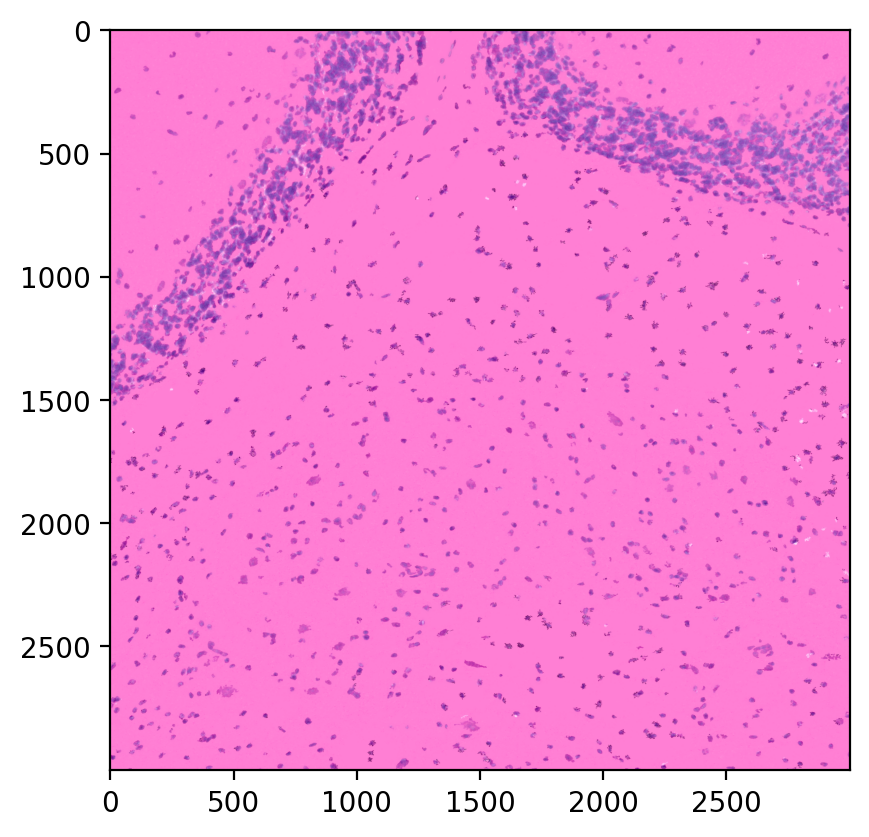

In [43]:
crop_img = img_keep_pink[17500:20500, 7000:10000]
plt.imshow(crop_img)

In [44]:
%%time
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
import skimage.io

img = img_keep_pink
model = StarDist2D.from_pretrained('2D_versatile_he')
# Percentile normalization of the image
# Adjust min_percentile and max_percentile as needed
min_percentile = 5
max_percentile = 95
img = normalize(img, min_percentile, max_percentile)

Found model '2D_versatile_he' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.
CPU times: user 40.2 s, sys: 7.23 s, total: 47.4 s
Wall time: 47.6 s


In [45]:
%%time
# Predict cell nuclei using the normalized image
# Adjust nms_thresh and prob_thresh 
labels, polys = model.predict_instances_big(img, axes='YXC', block_size=4096, prob_thresh=0.2, min_overlap=128, context=128, normalizer=None, n_tiles=(4,4,1))

effective: block_size=(4096, 4096, 3), min_overlap=(128, 128, 0), context=(128, 128, 0)


100%|█████████████████████████████████████████| 130/130 [06:52<00:00,  3.17s/it]

CPU times: user 11min 44s, sys: 51 s, total: 12min 35s
Wall time: 6min 53s


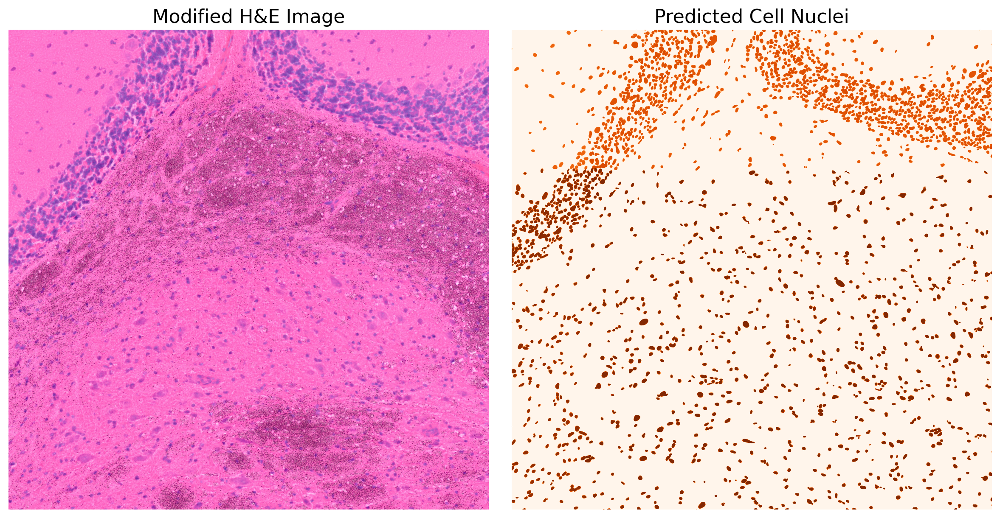

In [46]:
from skimage.measure import find_contours
crop_he = rgb[17500:20500, 7000:10000]
crop_pred = labels[17500:20500, 7000:10000]

 
contours = find_contours(crop_pred, level=0.5)  # 找到轮廓，level=0.5 适用于二值图像


fig, axes = plt.subplots(1, 2, figsize=(12, 6))  # 1 row, 2 columns
axes[0].imshow(crop_he)
axes[0].set_title('Modified H&E Image',fontsize=16)
axes[0].axis('off')
axes[1].imshow(crop_pred, cmap= 'Oranges')
axes[1].set_title('Predicted Cell Nuclei',fontsize=16)
axes[1].axis('off')


plt.tight_layout()
plt.show()

In [47]:
# Creating a list to store Polygon geometries
geometries = []

# Iterating through each nuclei in the 'polys' DataFrame
for nuclei in range(len(polys['coord'])):

    # Extracting coordinates for the current nuclei and converting them to (y, x) format
    coords = [(y, x) for x, y in zip(polys['coord'][nuclei][0], polys['coord'][nuclei][1])]

    # Creating a Polygon geometry from the coordinates
    geometries.append(Polygon(coords))

# Creating a GeoDataFrame using the Polygon geometries
gdf = gpd.GeoDataFrame(geometry=geometries)
gdf['id'] = [f"ID_{i+1}" for i, _ in enumerate(gdf.index)]

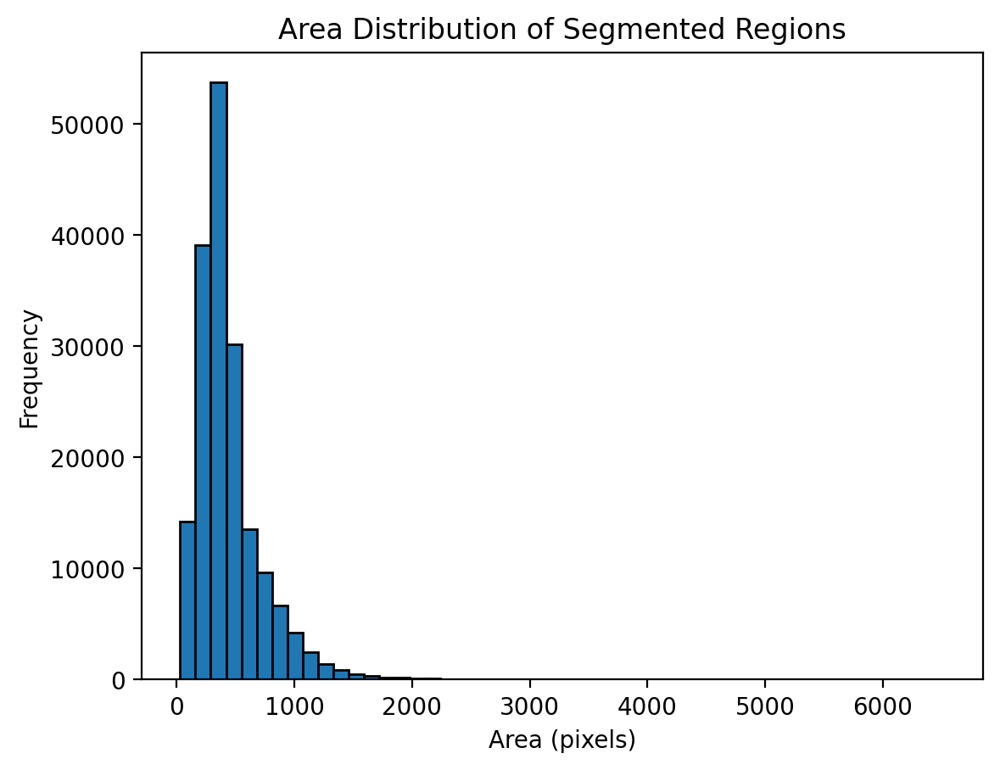

In [48]:
gdf['area'] = gdf['geometry'].area

# 绘制面积分布直方图
plt.hist(gdf['area'], bins=50, edgecolor="black")
plt.xlabel("Area (pixels)")
plt.ylabel("Frequency")
plt.title("Area Distribution of Segmented Regions")
# plt.xlim(0, 1000)  # 将 x 轴范围设置为 0 到 300
plt.show()

## below just an example if you do segmentation without segdecon-preprocessing-stack

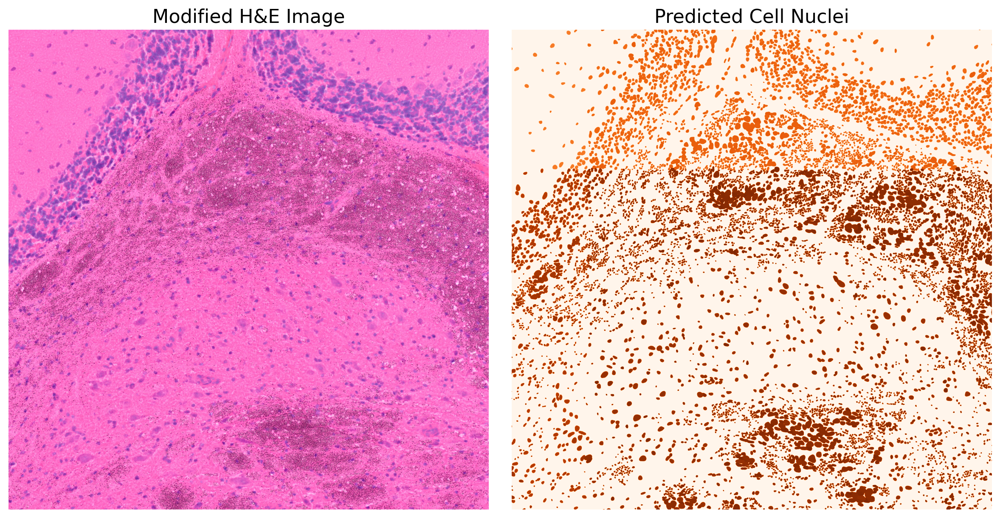

In [55]:
# crop_he = img_he[17500:20500, 7000:10000]
# crop_pred = labels[17500:20500, 7000:10000]


# contours = find_contours(crop_pred, level=0.5)  # 找到轮廓，level=0.5 适用于二值图像


# fig, axes = plt.subplots(1, 2, figsize=(12, 6))  # 1 row, 2 columns
# axes[0].imshow(crop_he)
# axes[0].set_title('Modified H&E Image',fontsize=16)
# axes[0].axis('off')
# axes[1].imshow(crop_pred, cmap= 'Oranges')
# axes[1].set_title('Predicted Cell Nuclei',fontsize=16)
# axes[1].axis('off')



# plt.tight_layout()
# plt.show()